In [1]:
import os
os.environ['OMP_NUM_THREADS'] = '1'

from tqdm.auto import tqdm
from multiprocessing import Pool

import numpy as np
from scipy import optimize
from matplotlib import pyplot as plt

import noctiluca as nl
import bayesmsd

In [2]:
saved = nl.io.load.hdf5('2025-03_minflux.h5')

In [3]:
data = saved['data']
data.makeSelection()

In [4]:
data.makeSelection('array')
data = data.copySelection()
conditions = ['ctrl', 'NT', 'IAA']

In [5]:
# Ultimately we will discard any (filtered & cut) trajectory shorter
# than 1K frames, so might as well do it here also, for convenience
data.makeSelection(lambda traj, _: traj.F < 1000)
data.deleteSelection()

print(len(data), 'trajectories')
print(len(list(filter(lambda tag: tag.startswith('file='), data.tagset()))), 'files')

720 trajectories
252 files


# Plot MSDs

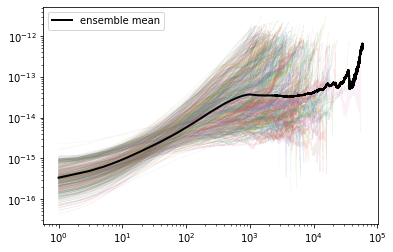

In [6]:
data.makeSelection()

nl.plot.msd_overview(data, linewidth=0.5, alpha=0.1)
plt.show()

# Filtering background trajectories
Visual inspection of the trajectories shows that
- there are many background traces; those are typically rather straight and along the y-direction
- real trajectories might include background tracks at the beginning or end
- otherwise, real trajectories are pretty stationary (on longest time scale)

The last point suggests the following approach to pruning each trajectory:
- calculate the median coordinates
- because the trajectories are "hairy sausages", we expect them to cross this median basically all the time; the only reason to deviate from this is long-time ballistic motion, which is what the background tracks are
- so: cut off everything before the first and after the last median crossing

Visual inspection (below) shows that this works decently well, except for singular exceptions.

In [7]:
# Technical check, since we assume below that first and last frame are valid
data.makeSelection()
for traj in data:
    assert not np.any(np.isnan(traj[[0, -1]]))

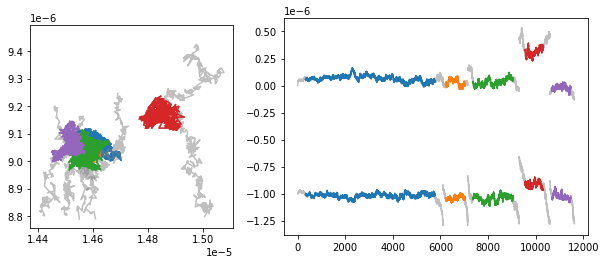

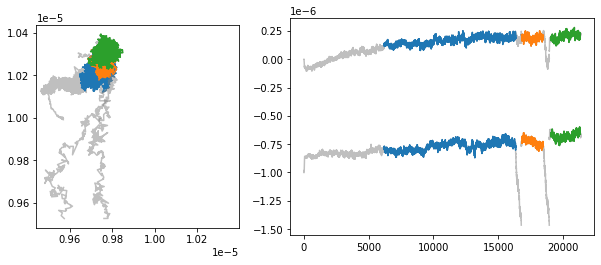

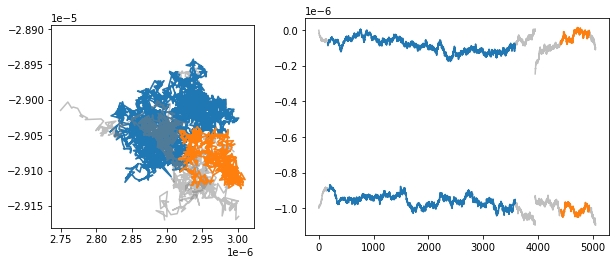

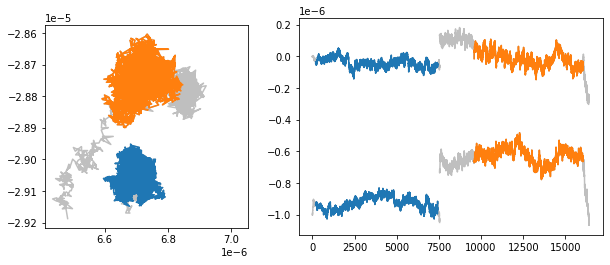

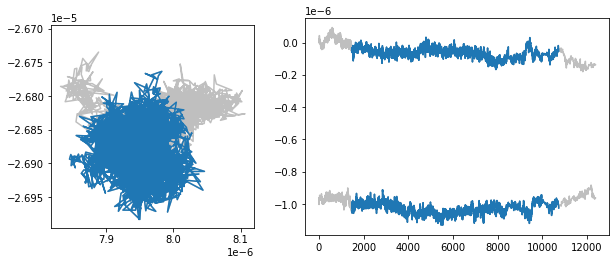

...

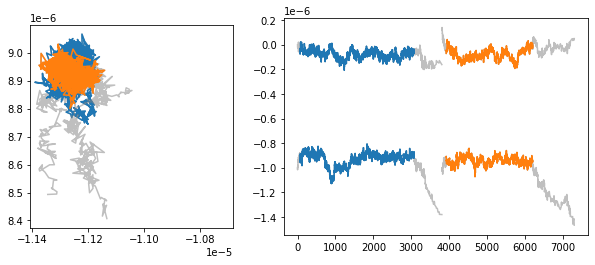

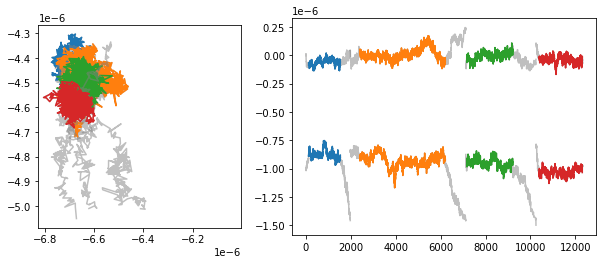

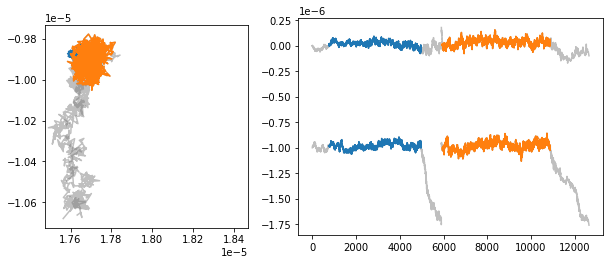

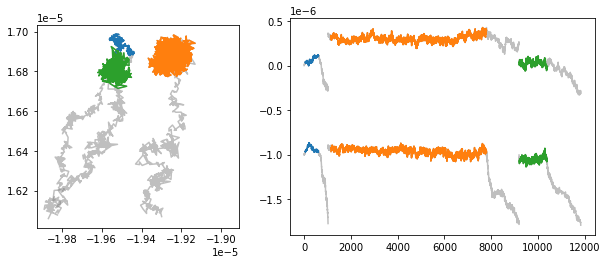

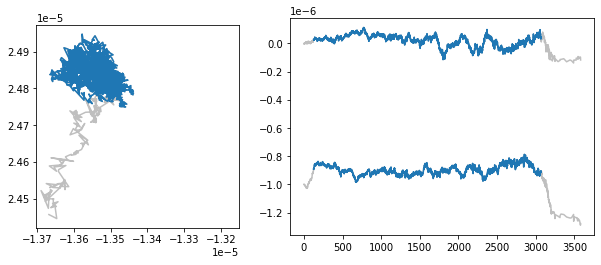

In [8]:
plotting = True # set to False to prevent plotting

data_valid = nl.TaggedSet()

data.makeSelection()
filetags = sorted({tag for tag in data.tagset() if tag.startswith('file=')})
for tag in filetags:
    data.makeSelection(tag)
    
    if plotting:
        fig, axs = plt.subplots(1, 2, figsize=[10, 4],
                                gridspec_kw={'width_ratios' : [4, 6]},
                               )
    
        t0 = 0
        off_x, off_y = data[0][0]
        off_y += 1e-6 # get an offset between the coordinates
        
    for i, (traj, tags) in enumerate(data(giveTags=True)):
        # Cut off background
        i_valid = np.nonzero(~np.isnan(traj.abs()[:]))[0]
        frames = traj[i_valid]
        med = np.median(frames, axis=0)
        above = frames > med[None, :]
        ind_crossing_x = np.nonzero(np.diff(above[:, 0]))[0]
        ind_crossing_y = np.nonzero(np.diff(above[:, 1]))[0]
        
        ind_start = max(ind_crossing_x[ 0]+1, ind_crossing_y[ 0]+1)
        ind_end   = min(ind_crossing_x[-1],   ind_crossing_y[-1]) #- len(frames)
        if ind_end > ind_start:
            t_start = i_valid[ind_start]
            t_end   = i_valid[ind_end  ]+1
            traj_valid = nl.Trajectory(traj[t_start:t_end], dt=traj.meta['dt'])
        else:
            traj_valid = None
        
        if traj_valid is not None:
            data_valid.add(traj_valid, tags)
        
        if plotting:
            ax = axs[0]
            nl.plot.spatial(traj, ax=ax, color='gray', alpha=0.5)# label=f'{i} | ')
            if traj_valid is not None:
                nl.plot.spatial(traj_valid, ax=ax, label=f'{i} | ')

            ax = axs[1]
            ind_valid = np.nonzero(~np.isnan(traj.abs()[:][:, 0]))[0]
            h = ax.plot(t0 + ind_valid, traj[ind_valid][:, 0] - off_x, color='gray', alpha=0.5)
            h = ax.plot(t0 + ind_valid, traj[ind_valid][:, 1] - off_y,
                        color=h[0].get_color(), alpha=0.5,
                       )
            if traj_valid is not None:
                ind = np.nonzero(~np.isnan(traj_valid.abs()[:][:, 0]))[0]
                h = ax.plot(t0 + t_start + ind, traj_valid[ind][:, 0] - off_x)
                h = ax.plot(t0 + t_start + ind, traj_valid[ind][:, 1] - off_y,
                            color=h[0].get_color(),
                           )

            t0 += ind_valid[-1] + 1

    if plotting:
        ax = axs[0]
        ax.axis('square')

        plt.show()

473 valid trajectories


  0%|          | 0/473 [00:00<?, ?it/s]

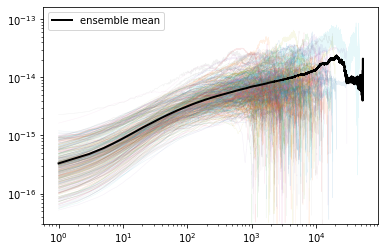

In [9]:
data_valid.makeSelection(lambda traj, _: traj.F < 1000)
data_valid.deleteSelection()
print(len(data_valid), 'valid trajectories')

with nl.Parallelize():
    _ = nl.analysis.MSD(data_valid, chunksize=1, show_progress=True)

nl.plot.msd_overview(data_valid, linewidth=0.5, alpha=0.1)
plt.ylim([3e-17, None])
plt.show()

 ctrl: 144 trajectories
   NT: 149 trajectories
  IAA: 180 trajectories


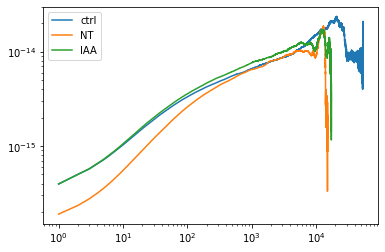

In [10]:
for cond in conditions:
    data_valid.makeSelection(cond)
    print(f'{cond:>5s}: {len(data_valid):>3d} trajectories')
    
    msd = nl.analysis.MSD(data_valid)
    plt.plot(np.arange(1, len(msd)), msd[1:], label=cond)
    
plt.legend()
plt.xscale('log')
plt.yscale('log')
plt.show()

In [11]:
data_valid.makeSelection()
len({tag for tag in data_valid.tagset() if tag.startswith('file=')})

250

In [12]:
nl.io.write.hdf5({
    'data' : data_valid,
    'conditions' : conditions,
    'description' : """
Cleaned-up MINFLUX array data

Cleaning was done by cutting before the first and after the last median-crossing

Conditions are:
 - 'NT'   : C36 (WT-like celltype)
 - 'ctrl' : F1M, -IAA (ΔRAD21 degron line, but degron inactive)
 - 'IAA'  : F1M, +IAA (ΔRAD21 degron line, degron active)
"""[1:-1]}, '20250302_array_clean.h5')